In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os
%matplotlib inline

## Camera Caliberation

Before starting the project, it is necessary that we Caliberate the camera, and correct any distortions, as they might give a huge error during the calculations, which could be fatal in the case of Self Driving cars

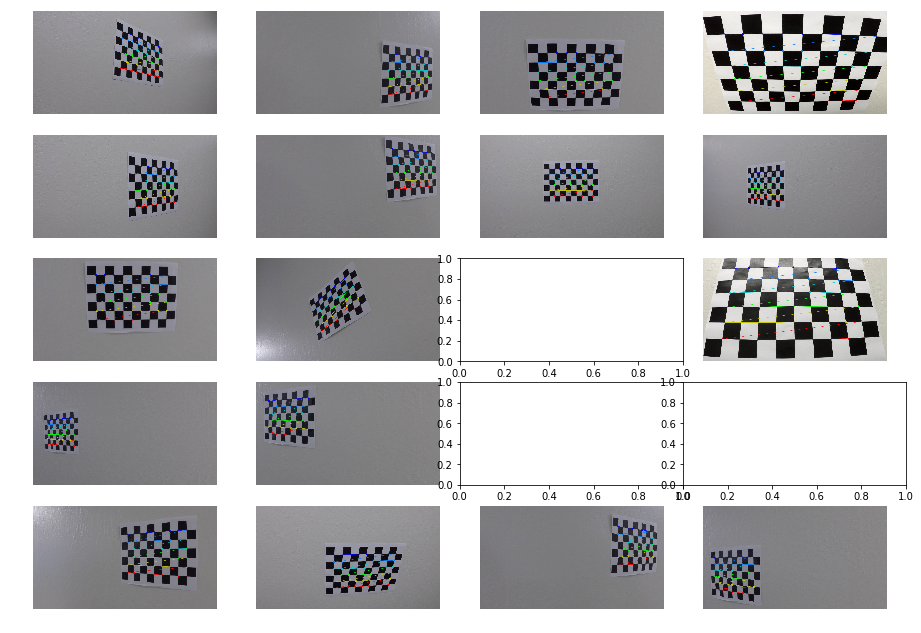

In [2]:
# The number of boxes in the image
nx = 9  # The number of inside corners in x
ny = 6  # The number of inside corners in y

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

path_of_calib_images = './camera_cal/'
list_calib_images = os.listdir(path = path_of_calib_images)

object_points = []
image_points = []

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

fig, axs = plt.subplots(5,4, figsize=(16, 11))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

for i,fname in enumerate(list_calib_images):
    
    img = mpimg.imread(path_of_calib_images + fname)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == True:
        object_points.append(objp)
        
        # For better refinement of the corners
        corners_ = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        image_points.append(corners_)
        
        # Draw the coreners for visualization
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(img)

There are 3 images from the total of 20 images in which the corner detection algorithm did'nt work, but still there was ample of data collected for the calliberation of the camera, so moving forward to the caliberation step

Text(0.5,1,'Undistorted Image')

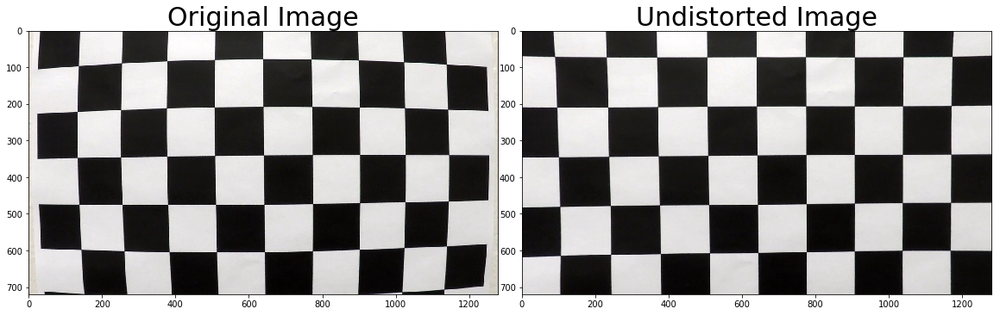

In [3]:
# Testing undistortion on an image

img = mpimg.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1],img.shape[0])

# Do the camera caliberations given the image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, img_size, None, None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# saving the camera caliberations as a pickle file so that we can retrieve it later to undistort the images

dist_p = {}
dist_p["mtx"] = mtx
dist_p["dist"] = dist
pickle.dump(dist_p, open("caliberation.p","wb"))

# Let's look at the quality of undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

Therefore the distortion correction in the image, looks pretty decent for now

Now Let's look at how this distortion correction looks in an actual image that has been captured in a car

In [4]:
def undistort(img, show=False):
    image_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if show:
        f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
        axis1.imshow(img)
        axis1.set_title('Input Image', fontsize=16)
        axis2.imshow(undist)
        axis2.set_title('Undistorted Image', fontsize=16)
    else:
        return undist

### Visualizing the Undistortion in the actual images taken from the car

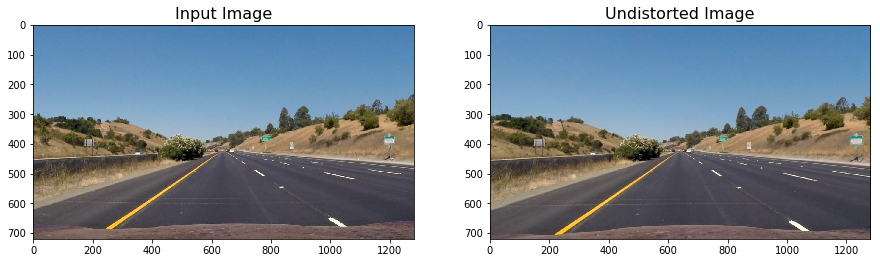

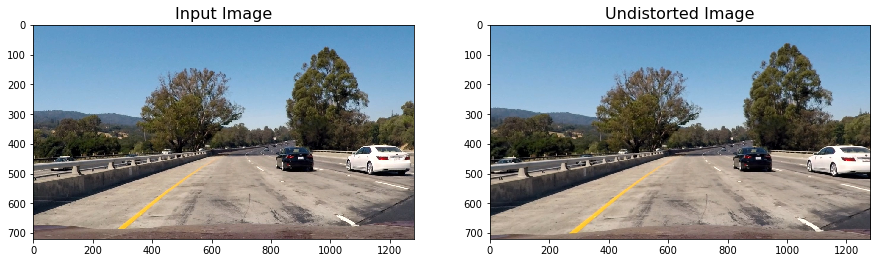

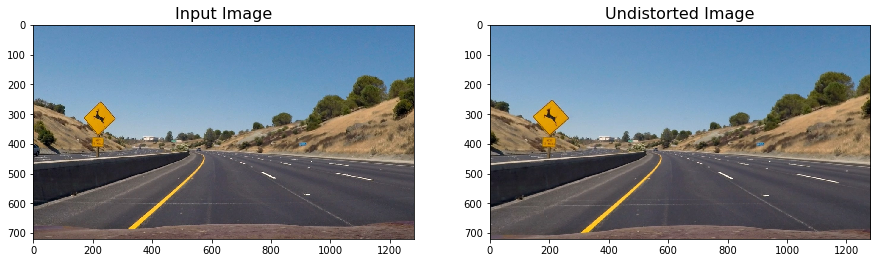

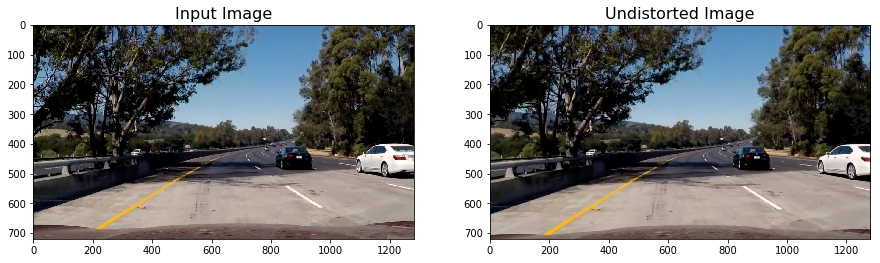

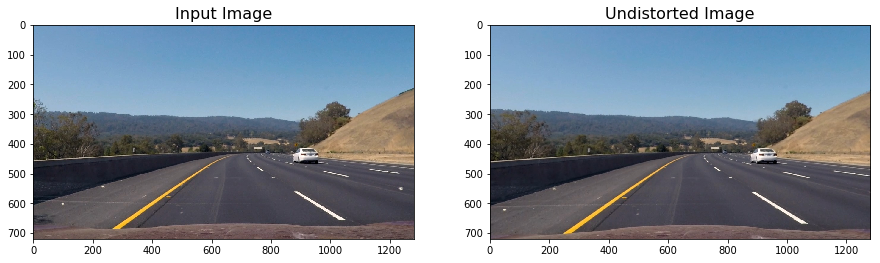

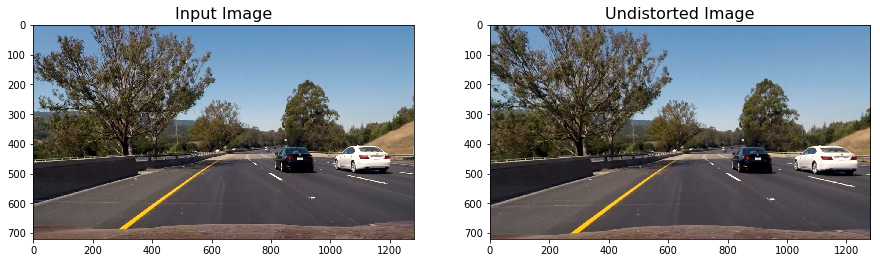

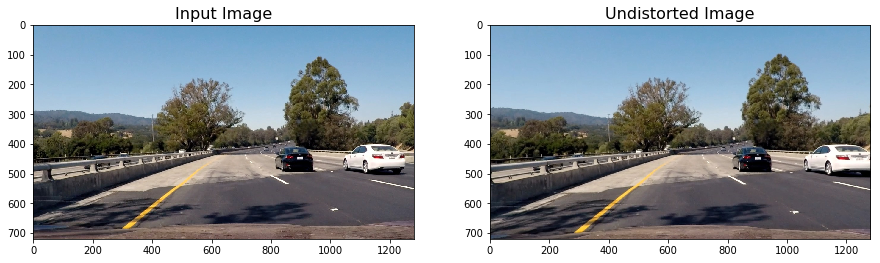

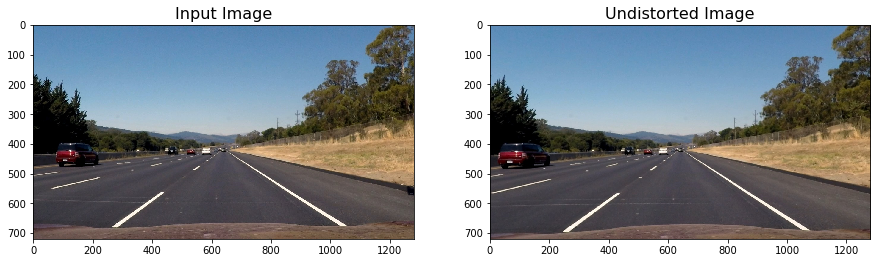

In [5]:
test_images = './test_images/*.jpg'
test_images_list = glob.glob(test_images)
for image in test_images_list:
    image = mpimg.imread(image)
    undistort(image,True)

The effect might not be very clearly visible to the human eye but there is it is there

## Edge detection step

As the camera caliberations are now complete, let's move on, to detect the edges in the image, our ultimate aim is to detect the lane lines, this can be achieved using the differect sobel filter approaches and exploring the different color spaces.

A lot of time was spent on this step, finally coming up with the following pipeline for the thresholding step

In [6]:
# This function will only take care of our region of interest, in our case the region of the road, which contains
# lane lines

def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [7]:
# These are all the thresholding functions that were discussed in the lectures, and some additional ones too

def abs_sobel_threshold(img, orient = 'x', sobel_kernel = 3 ,abs_thresh = (0,255)):
    if len(img.shape)==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    sobel = None
    if (orient=='x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_sobel = np.zeros_like(scaled_sobel)
    binary_sobel[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel < abs_thresh[1])] = 1
    return binary_sobel

# Taking into account both the x and the y sobel thresholds and taking the magnitude of both to get one threshold 
def mag_threshold(img, sobel_kernel = 3, mag_thresh = (0,255)):
    if len(img.shape)==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255.0
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag > mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    return binary_output

# Finding the directional threshold based on the directions in which these gradients point, (changing the space)
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2.0)):
    if len(img.shape)==3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir > thresh[0]) & (absgraddir < thresh[1])] = 1
    return binary_output

In [10]:
area_of_interest = [[150+430,460],[1150-440,460],[1150,720],[150,720]]

In [11]:
def abs_sobel_thresh(image,orient,  thresh=(20, 100)):
    gray=cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    if orient=='x':
        sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0)
        sobelx=np.absolute(sobelx)
        scaled_sobel=np.uint8(255*sobelx/np.max(sobelx))
        sx_binary=np.zeros_like(scaled_sobel)
        sx_binary[(scaled_sobel>=thresh[0]) & (scaled_sobel<=thresh[1])]=1
        binary_output=np.copy(sx_binary)
    if orient=='y':
        sobely=cv2.Sobel(gray,cv2.CV_64F,0,1)
        sobely=np.absolute(sobely)
        scaled_sobel=np.uint8(255*sobely/np.max(sobely))
        sx_binary=np.zeros_like(scaled_sobel)
        sx_binary[(scaled_sobel>=thresh[0]) & (scaled_sobel<=thresh[1])]=1
        binary_output=np.copy(sx_binary)
    return binary_output


def mag_thresh(img, mag_thresh=(20,150)):
    
    # Apply the following steps to img
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0)
    sobely=cv2.Sobel(gray,cv2.CV_64F,0,1)
    sobel=np.sqrt(np.square(sobelx)+np.square(sobely))
    scaled_sobel=np.uint8(255*sobel/np.max(sobel))
    
    t=sum((i > 150) &(i<200)  for i in scaled_sobel)
#     print(np.sum(t))
#     print(scaled_sobel.shape)
    binary_sobel=np.zeros_like(scaled_sobel)
    binary_sobel[(scaled_sobel>=mag_thresh[0]) & (scaled_sobel<=mag_thresh[1])]=1
#     print(mag_thresh[0],mag_thresh[1])
#     binary_sobel[(scaled_sobel>=20) & (scaled_sobel<=150)]=1
#     plt.imshow(binary_sobel)
#     plt.show()
    return binary_sobel

def dir_threshold(img,  thresh=(0.7,1.3)):
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    sobelx=np.absolute(cv2.Sobel(gray,cv2.CV_64F,1,0))
    sobely=np.absolute(cv2.Sobel(gray,cv2.CV_64F,0,1))
    dir_=np.arctan2(sobely,sobelx)
    sx_binary = np.zeros_like(gray)
#     print(thresh[0],thresh[1])
    sx_binary[(dir_>=thresh[0]) &(dir_<=thresh[1])]=1
    binary_output=sx_binary
    return binary_output

def color_space(image,thresh=(170,255)):
    hls=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    l_channel=hls[:,:,1]
#     plt.imshow(l_channel)
#     plt.show()
    s_channel=hls[:,:,2]
#     plt.imshow(s_channel)
#     plt.show()
    s_binary=np.zeros_like(s_channel)
    s_binary[(s_channel>=thresh[0]) & (s_channel<=thresh[1])& (l_channel>=80) ]=1
    color_output=np.copy(s_binary)
    return color_output

def gradient_color_thresh(image):
    ksize=3
    image=undistort(image)
    gradx = abs_sobel_thresh(image, orient='x', thresh=(20, 200))
    grady = abs_sobel_thresh(image, orient='y', thresh=(20, 200))
    # plt.imshow(gradx)
    # plt.show()
    # plt.imshow(grady)
    # plt.show()
    mag_binary = mag_thresh(image, mag_thresh=(20, 200))
    # plt.imshow(mag_binary)
    # plt.show()

    dir_binary = dir_threshold(image, thresh=(0.7, 1.3))
    color_binary=color_space(image,thresh=(100,255))
    
    combined = np.zeros_like(dir_binary)
    # combined[((gradx == 1)& (grady == 1)) |(color_binary==1)] = 1
    combined[(color_binary==1)|((gradx == 1)& (grady == 1)) |(mag_binary==1) &(dir_binary==1)] = 1
#     plt.imshow(combined)
#     plt.show()
    kernel = np.ones((3,3),np.uint8)
    morph_image=combined[600:,:950]
    # morph_image = cv2.morphologyEx(morph_image, cv2.MORPH_CLOSE, kernel)
    morph_image = cv2.morphologyEx(morph_image, cv2.MORPH_OPEN, kernel)
    # morph_image=cv2.erode(morph_image,kernel,iterations = 1)
    combined[600:,:950]=morph_image
    return combined

In [8]:
def thresh_pipeline(img, show=True):
    
    # Apply the Gaussian Blurring
    kernel_size = 5
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    
    # Convert to HLS Color space and take in consideration the l and the s color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    
    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Sobel kernel size
    ksize = 7
    
    # Apply the various types of thresholds
    gradx = abs_sobel_threshold(gray, 'x', sobel_kernel=ksize, abs_thresh=(10,255))
    grady = abs_sobel_threshold(gray, 'y', sobel_kernel=ksize, abs_thresh=(60,255))
    mag_binary = mag_threshold(gray, sobel_kernel=ksize, mag_thresh=(40,255))
    dir_binary = dir_threshold(gray, sobel_kernel=ksize, thresh=(0.6,1.05))
    
    # Combine all the threshold information
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(combined)
    s_binary[(s > 160) & (s < 255)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors    
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1
    
    # Defining vertices for marked area
    imshape = img.shape
    left_bottom = (100, imshape[0])
    right_bottom = (imshape[1]-20, imshape[0])
    apex1 = (610, 410)
    apex2 = (680, 410)
    inner_left_bottom = (310, imshape[0])
    inner_right_bottom = (1150, imshape[0])
    inner_apex1 = (700,480)
    inner_apex2 = (650,480)
    vertices = np.array([[left_bottom, apex1, apex2, \
                          right_bottom, inner_right_bottom, \
                          inner_apex1, inner_apex2, inner_left_bottom]], dtype=np.int32)
    
    # Masked area
    color_binary = region_of_interest(color_binary, vertices)
    
    if show==True:
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize = (17,13))
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax1.imshow(undistort(img,show=False))
        ax1.set_title('Orignal Image', fontsize=16)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Combined Binary', fontsize=16)
        ax3.set_title('S Binary', fontsize=16)
        ax3.imshow(s_binary,cmap='gray')
        ax4.imshow(color_binary,cmap='gray')
        ax4.set_title('Color Binary', fontsize=16)
    else:
        return color_binary

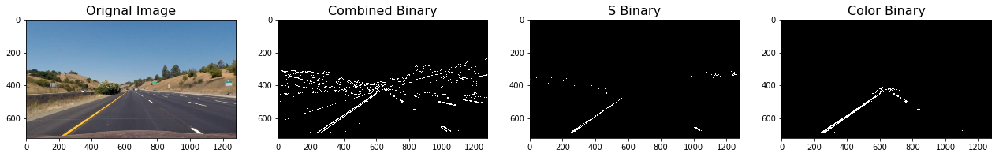

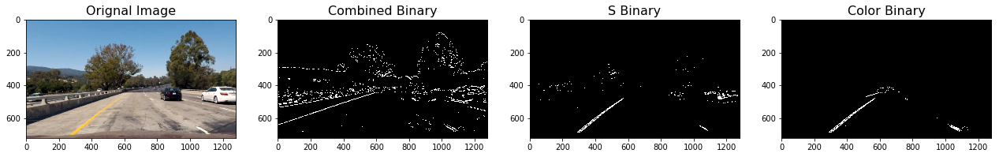

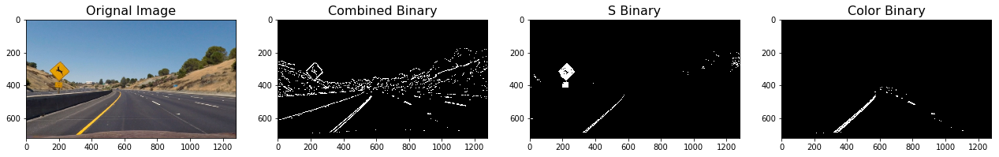

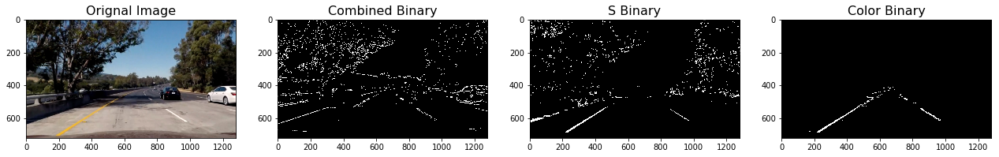

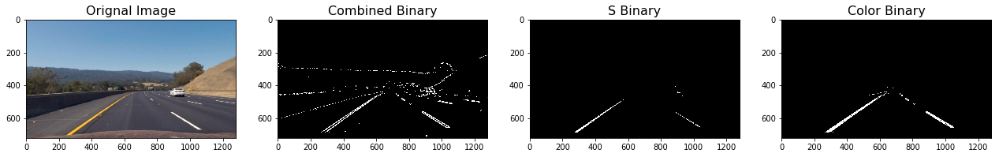

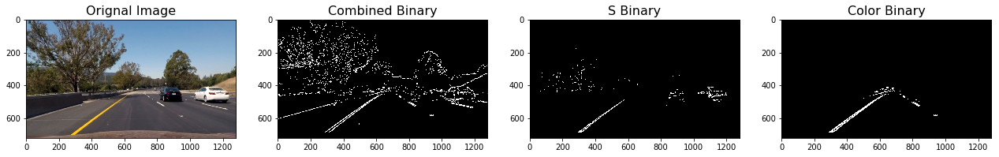

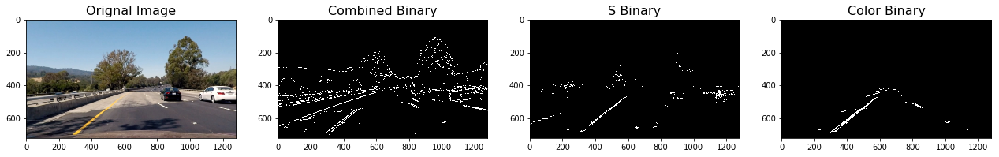

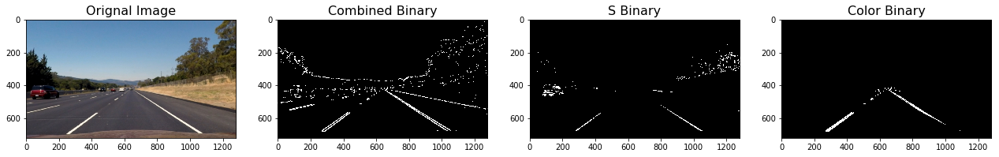

In [9]:
for image in glob.glob(test_images):
    thresh_pipeline(mpimg.imread(image))

As we can see that the results of the final color binary are very decent, therefore now we can move on to the next step of the pipeline, which is Perspective transform or the Bird Eye View

## Perspective Transform

We need the perspective transform, so that we can get the bird's eye view of the image, this will help us 

> 1) Understand the curvature of the lane lines better, also will help us focus on the lane lines <br>
2) It will be easier to fit a curve on the lane lines

In [12]:
def perspective_transform(image):
    src=np.float32([[195,720],[590,460],[700,460],[1120,720]])
    dst=np.float32([[350,720],[410,0],[970,0],[1000,720]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    img_size=(image.shape[1],image.shape[0])
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

The points were manually handpicked, from analyzing the test images

The perspective transform allows us to analyze the roads properly

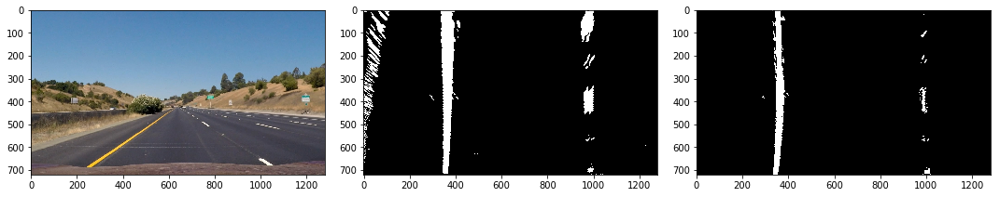

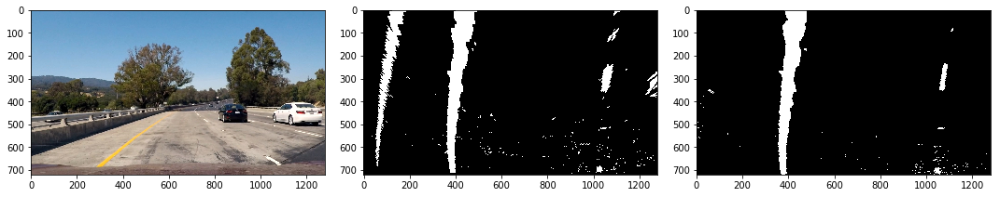

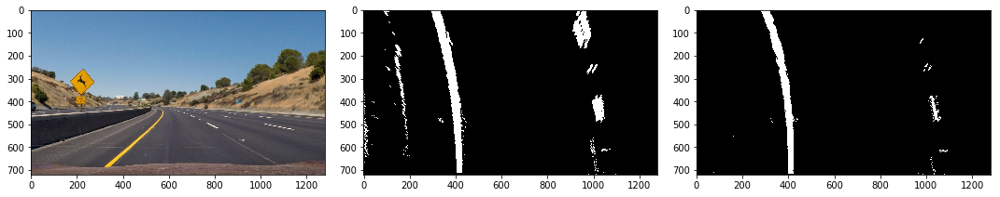

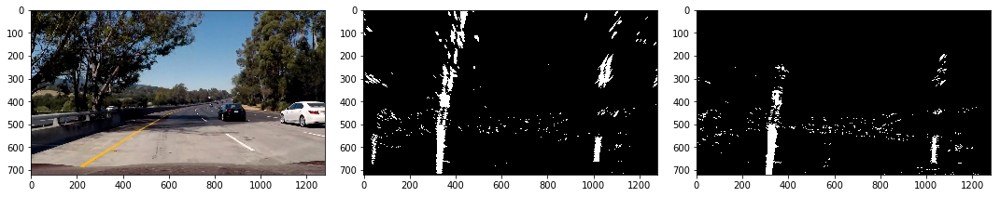

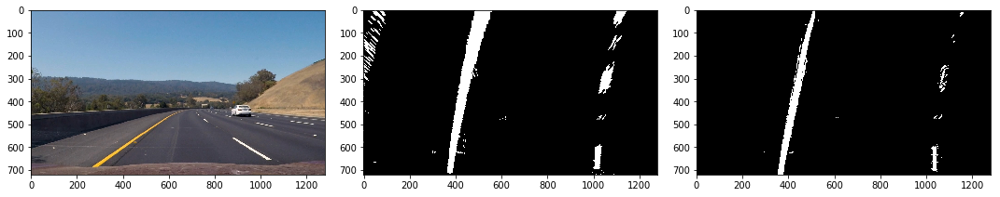

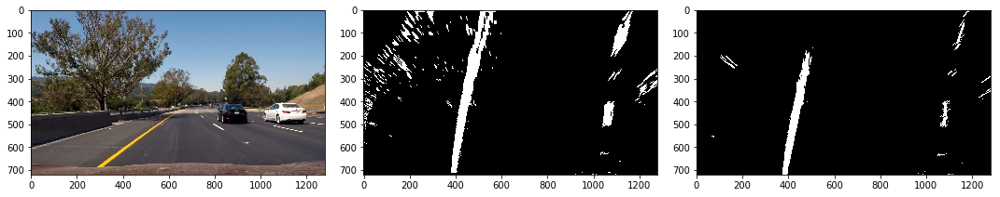

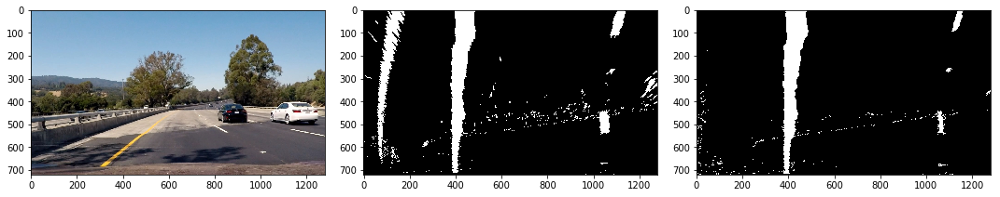

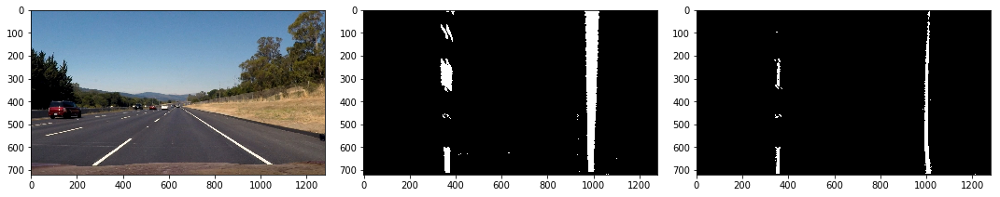

In [13]:
for img in glob.glob(test_images):
    im = mpimg.imread(img)
    color_thresh = gradient_color_thresh(im)
    pers_tran = perspective_transform(im)
    col_per = perspective_transform(gradient_color_thresh(im))
    per_col = gradient_color_thresh(perspective_transform(im))
    f, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,10))
    f.tight_layout()
    ax1.imshow(im)
    ax2.imshow(col_per, cmap='gray')
    ax3.imshow(per_col, cmap='gray')

As you can see from this, the right most column is of the images, in which apply thresholding after perspective transform, and this approach gives us very decent results

In [14]:
src=np.float32([[195,720],[590,460],[700,460],[1120,720]])
dst=np.float32([[350,720],[410,0],[970,0],[1000,720]])
Minv = cv2.getPerspectiveTransform(dst, src)

## Main Pipeline

### The sliding window approach

In [15]:
# Let's take an example of the image 'test1.jpg'

im = mpimg.imread('./test_images/test1.jpg')
binary_warped = gradient_color_thresh(perspective_transform(im))
histogram = np.sum(binary_warped[int(binary_warped.shape[0]//2):,:], axis=0)
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint
nwindows = 9
window_height = np.int(binary_warped.shape[0]/nwindows)
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
leftx_current = leftx_base
rightx_current = rightx_base
margin = 100
minpix = 50
left_lane_inds = []
right_lane_inds = []
for window in range(nwindows):
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                      (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                       (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)
# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


(720, 0)

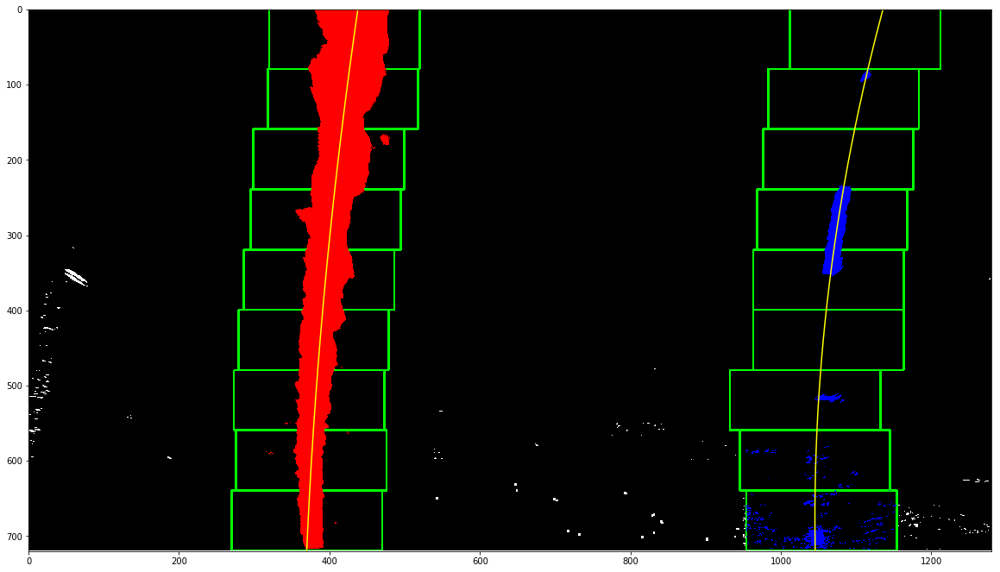

In [16]:
# Let's view the pipeline
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.figure(figsize=(20,20))
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

As you can see the lane lines are very eligantly captures by the function

(720, 0)

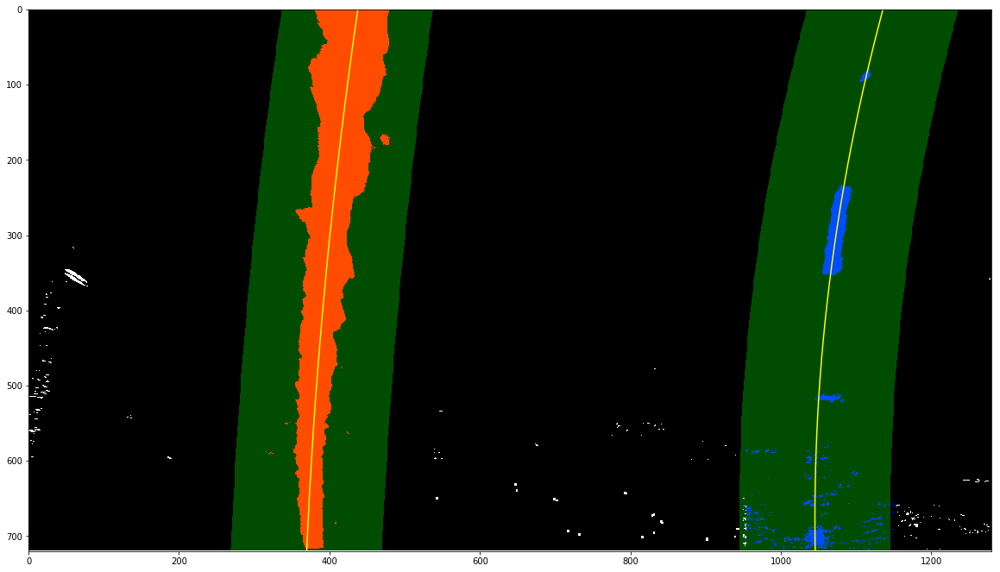

In [17]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure(figsize=(20,20))
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## The whole pipeline, including the calculations of radius of curvature

In [23]:
def pipeline(warped,image,left_fit,right_fit,count):
    binary_warped=warped
    if count==0:
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
        ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
        quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
        # For each y position generate random x position within +/-50 pix
        # of the line base position in each case (x=200 for left, and x=900 for right)
        leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                      for y in ploty])
        rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                        for y in ploty])

        leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
        rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


        # Fit a second order polynomial to pixel positions in each fake lane line
        left_fit = np.polyfit(ploty, leftx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fit = np.polyfit(ploty, rightx, 2)
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        y_eval = np.max(ploty)
        left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
        right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
        
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        middle = (left_fitx[-1] + right_fitx[-1])//2
        veh_pos = image.shape[1]//2
        dx = (veh_pos - middle)*xm_per_pix # Positive if on right, Negative on left
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result,'Left radius of curvature  = %.2f m'%(left_curverad),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
        cv2.putText(result,'Right radius of curvature = %.2f m'%(right_curverad),(50,80), font, 1,(255,255,255),2,cv2.LINE_AA)
        cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,110),
                        font, 1,(255,255,255),2,cv2.LINE_AA)
        count=count+1
        return result
    else:
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        # Minv = cv2.getPerspectiveTransform(dst, src)
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
        
        ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
        quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
        # For each y position generate random x position within +/-50 pix
        # of the line base position in each case (x=200 for left, and x=900 for right)
        leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                      for y in ploty])
        rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                        for y in ploty])

        leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
        rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


        # Fit a second order polynomial to pixel positions in each fake lane line
        left_fit = np.polyfit(ploty, leftx, 2)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fit = np.polyfit(ploty, rightx, 2)
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        y_eval = np.max(ploty)
        left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
        right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
        
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        middle = (left_fitx[-1] + right_fitx[-1])//2
        veh_pos = image.shape[1]//2
        dx = (veh_pos - middle)*xm_per_pix # Positive if on right, Negative on left
        
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result,'Left radius of curvature  = %.2f m'%(left_curverad),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
        cv2.putText(result,'Right radius of curvature = %.2f m'%(right_curverad),(50,80), font, 1,(255,255,255),2,cv2.LINE_AA)
        cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,110),
                            font, 1,(255,255,255),2,cv2.LINE_AA)
        return result

In [24]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [25]:
left_fit=[]
right_fit=[]
count=0

def process_image(image):
    undist_image=undistort(image)
#     gray_image=cv2.cvtColor(undist_image,cv2.COLOR_RGB2GRAY)
    thresh_image=gradient_color_thresh(undist_image)
    warped=perspective_transform(thresh_image)
    result=pipeline(warped,undist_image,left_fit,right_fit,count)
    return result

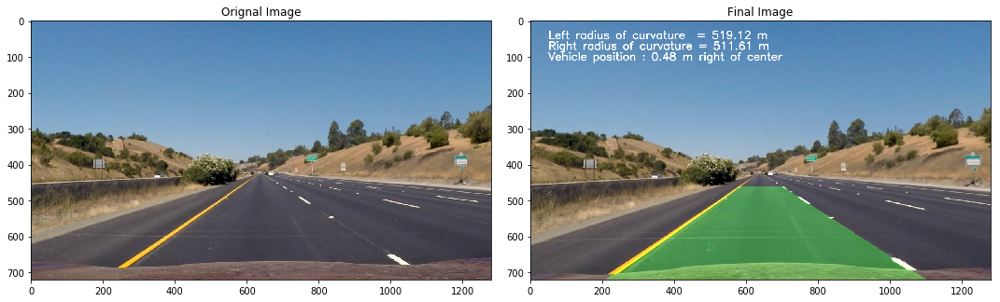

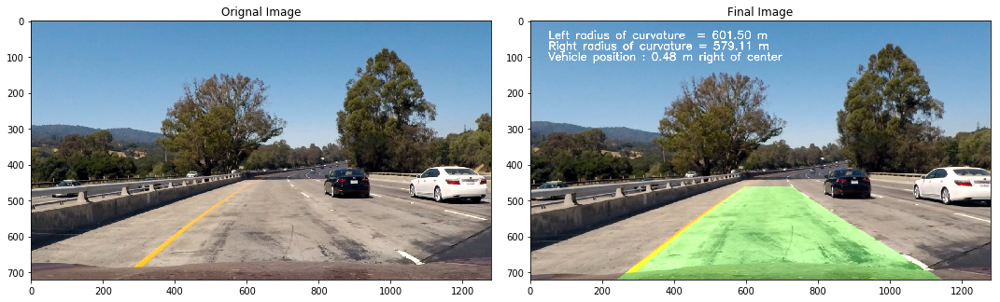

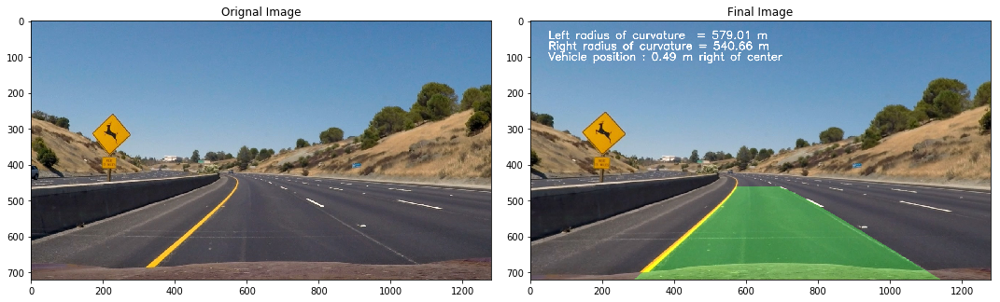

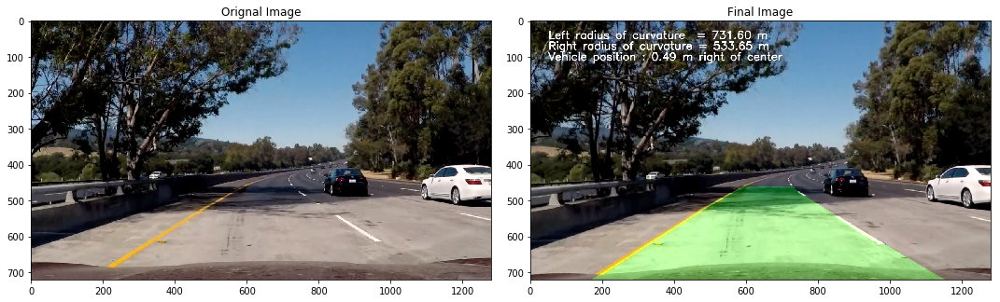

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


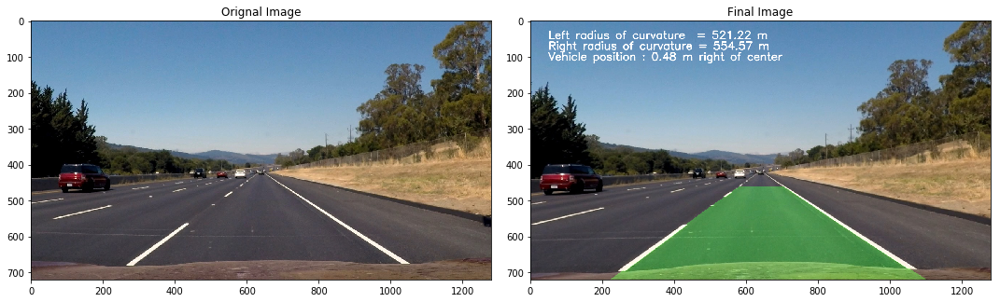

In [26]:
for img in glob.glob(test_images):
    img = mpimg.imread(img)
    result = process_image(img)
    f, (axs1, axs2) = plt.subplots(1,2,figsize=(15,10))
    f.tight_layout()
    axs1.set_title('Orignal Image')
    axs1.imshow(img)
    axs2.set_title('Final Image')
    axs2.imshow(result)

We can see that the pipeline works very well on the test images

## Now let's try this on a video

In [355]:
left_fit=[]
right_fit=[]
count=0

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [06:17<00:00,  3.43it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 13min 2s, sys: 10.1 s, total: 13min 12s
Wall time: 6min 19s


In [ ]:
left_fit=[]
right_fit=[]
count=0

challenge_output = './my_video_outputs/challenge_video_output.mp4'
challenge_input = VideoFileClip('challenge_video.mp4')
processed_video1 = challenge_input.fl_image(process_image)
%time processed_video1.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video ./my_video_outputs/challenge_video_output.mp4
[MoviePy] Writing video ./my_video_outputs/challenge_video_output.mp4


 79%|███████▉  | 384/485 [01:54<00:29,  3.47it/s]

In [354]:
left_fit=[]
right_fit=[]
count=0

harder_output = 'harder_challenge_video_output.mp4'
harder_input = VideoFileClip('harder_challenge_video.mp4')
processed_video2 = harder_input.fl_image(process_image)
%time processed_video.write_videofile(harder_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1260/1261 [06:18<00:00,  3.20it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 13min 2s, sys: 10 s, total: 13min 12s
Wall time: 6min 20s


In [29]:
left_fit=[]
right_fit=[]
count=0
video_output3 = './my_video_outputs/harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('harder_challenge_video.mp4')#.subclip(0,3)
#video_input3.save_frame("hard_challenge01.jpeg") # saves the first frame
processed_video = video_input3.fl_image(process_image)
%time processed_video.write_videofile(video_output3, audio=False)

[MoviePy] >>>> Building video ./my_video_outputs/harder_challenge_video_output.mp4
[MoviePy] Writing video ./my_video_outputs/harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [06:34<00:00,  3.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./my_video_outputs/harder_challenge_video_output.mp4 

CPU times: user 12min 56s, sys: 9.68 s, total: 13min 6s
Wall time: 6min 36s
